# Dependency Import


In [ ]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

#Load File Functions


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
%ls

drive/  sample_data/


In [ ]:
features = { } #Idea was to save everything we compute for further usage (like feature map construction), but for now it has not been implemented.

In [ ]:
def preprocess_notes(notes):
  #Load Filese
  loaded_notes = list(map(lambda x: (x[0], (librosa.load(x[1]))), notes))
  #Trim silence parts
  trimmed_notes = list(map(lambda x: (x[0], ((librosa.effects.trim(x[1][0])[0], x[1][1]))), loaded_notes))
  for note in trimmed_notes: 
    features[note[0]] = { }
  return trimmed_notes

# Plotting Functions

### Grid Plot

This function allows us to visualize in a grid plots regarding different intruments and notes, in order to easily visualize seasonality and similarities among waves and spectrogrms

In [ ]:
# Wrapping plotting function to display all images closer
nnotes = 3
ninstruments = 4

def grid_plot(plotting_func, h_only=False, save_feature=True): 
  fig, axarr  = plt.subplots(nrows=nnotes, ncols=ninstruments)
  fig.set_size_inches(10*ninstruments, 6*nnotes)

  # Dislpay plots having notes on rows and instruments on columns 
  for i, sound in enumerate(notes): 
    row = i % nnotes
    col = i // nnotes
    name, note = sound

    # Analyzing only harmonics can be useful
    if(h_only): 
      note = (librosa.effects.hpss(note[0])[0], note[1])
      
    #Execute transformation, features are saved for further usage.   
    feature, feature_name = plotting_func(note[0], note[1], name, (fig, axarr[row, col] ))

    #Harmonics != Full
    if(h_only): 
      feature_name += '_harmonics'

    # Saving computed stuff for further usage
    if(save_feature): 
      features[name][feature_name] = feature 

  plt.tight_layout()

### Power Spectrogram (Logaritmic) 

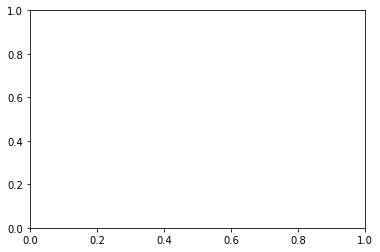

In [ ]:
#Compute STFT to visualize spectrogram
def full_spectrogram(y, sr, title="", plot=plt.subplots()): 
    D= librosa.stft(y)
    rp = np.max(np.abs(D))
    librosa.amplitude_to_db(np.abs(D), ref=rp)
    fig, ax = plot
    img = librosa.display.specshow(D, ax=ax,
                         y_axis='log', x_axis='time')
    ax.set(title=title + ': Power Spectrogram')
    ax.label_outer()
    fig.colorbar(img, ax=ax)
    return D, 'stft'

 ### Harmonics and Percussive decomposition

*   Harmonic part is informative about sound pitch 
*   Percussive part can be significant in terms of note dynamic 



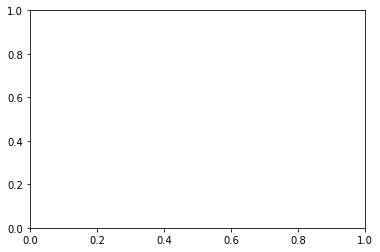

In [ ]:
#Plot both harmonic and percussive components aplitudes
# NO FEATURE SAVING IMPLEMENTED 
def plot_wave_hps(y, sr, title="",  plot=plt.subplots()): 
  y_harm, y_perc = librosa.effects.hpss(y)
  fig, ax = plot
  librosa.display.waveplot(y_harm, sr=sr, alpha=0.25, ax=ax)
  librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5, ax=ax)  
  ax.set(title=title + ': Harmonic + Percussive')
  return [], ''

### Spectral cerntroids visualization 
Possibily computable on full spectrum or decomposed one... 

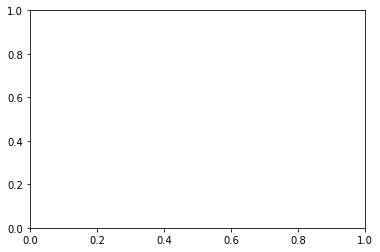

In [ ]:
#Compute spectral centroids 
def spectral_centroids(y,sr, title="", plot=plt.subplots()): 
  cent = librosa.feature.spectral_centroid(y=y, sr=sr)
  S, phase = librosa.magphase(librosa.stft(y))
  times = librosa.times_like(cent)
  fig, ax = plot
  plt.title(title)
  ax.plot(times, cent.T, label='Spectral centroid', color='green')
  ax.legend(loc='upper right')
  ax.set(title=title)
  return cent, 'centroids'

### Harmonics Spectrogram


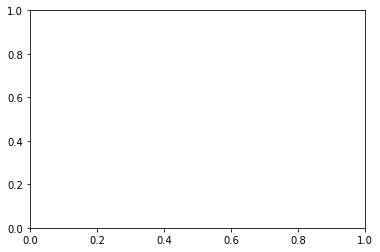

In [ ]:
def harmonics_spectrograms(y, sr, title="", plot=plt.subplots()): 
    D= librosa.stft(y)
    rp = np.max(np.abs(D))
  
    D_harmonic, D_percussive = librosa.decompose.hpss(D)
    fig, ax = plot
    img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_harmonic), ref=rp),
                            y_axis='log', x_axis='time', ax=ax)
    ax.set(title=title + ': Harmonic spectrogram')
    ax.label_outer()

    ax.label_outer()
    fig.colorbar(img, ax=ax)
    
    return D_harmonic, 'harmonics'

### Percussive component spectrogram

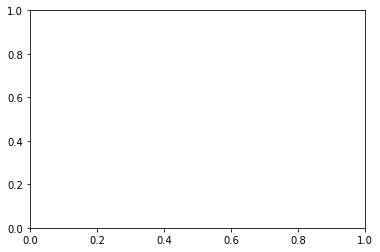

In [ ]:
def percussive_spectrograms(y, sr, title="", plot=plt.subplots()): 
    D= librosa.stft(y)
    rp = np.max(np.abs(D))
  
    D_harmonic, D_percussive = librosa.decompose.hpss(D)
    fig, ax = plot
    img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_percussive), ref=rp),
                            y_axis='log', x_axis='time', ax=ax)
    ax.set(title=title + ': Percussive spectrogram')
    ax.label_outer()

    ax.label_outer()
    fig.colorbar(img, ax=ax)

    return D_percussive, 'percussive'

### Salience Spectrogram

**Extra feature** (offered by Librosa). 

Hopefully will tell us more about harmonic energy at each frequency.


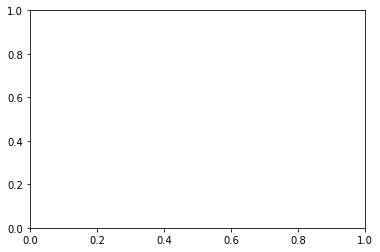

In [ ]:
def salience_spectrogram(y, sr, title="", plot=plt.subplots()): 
  S = np.abs(librosa.stft(y))
  freqs = librosa.fft_frequencies(sr=sr)
  harms = [1, 2, 3, 4]
  weights = [1.0, 0.5, 0.33, 0.25]
  S_sal = librosa.salience(S, freqs=freqs, h_range=harms, weights=weights, fill_value=0)
  fig, ax = plot

  img = librosa.display.specshow(librosa.amplitude_to_db(S_sal,
                                                        ref=np.max),
                                sr=sr, y_axis='log', x_axis='time', ax=ax)
  ax.set(title=title + ': Salience spectrogram')
  fig.colorbar(img, ax=ax, format="%+2.0f dB")

  return S_sal, 'salience'

###Spectral Bandwidth

****Extra feature** (offered by Librosa).

Bandwidth is the difference between the upper and lower frequencies in a continuous band of frequencies.

Librosa function computes the p’th-order spectral bandwidth.

The spectral bandwidth 1 at frame t is computed by:


```
# (sum_k S[k, t] * (freq[k, t] - centroid[t])**p)**(1/p)
```






> Klapuri, A., & Davy, M. (Eds.). (2007). Signal processing methods for music transcription, chapter 5. Springer Science & Business Media.




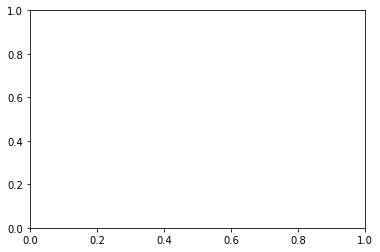

In [ ]:
def spectral_bandwidth(y, sr, title="", plot=plt.subplots()): 
  
  spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
  S, phase = librosa.magphase(librosa.stft(y=y))
  freqs, times, D = librosa.reassigned_spectrogram(y, fill_nan=True)
  fig, ax = plot
  times = librosa.times_like(spec_bw)
  centroid = librosa.feature.spectral_centroid(S=S)
  librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                          y_axis='log', x_axis='time', ax=ax)
  ax.set(title=title + ': Bandwidth')
  ax.fill_between(times, np.maximum(0, centroid[0] - spec_bw[0]),
                  np.minimum(centroid[0] + spec_bw[0], sr/2),
                  alpha=0.5, label='Centroid +- bandwidth')
  ax.plot(times, centroid[0], label='Spectral centroid', color='w')
  ax.legend(loc='lower right')

  return spec_bw,'spectral_danwidths'

### Spectral contrast

Each frame of a spectrogram S is divided into sub-bands. For each sub-band, the energy contrast is estimated by comparing the mean energy in the top quantile (peak energy) to that of the bottom quantile (valley energy). High contrast values generally correspond to clear, narrow-band signals, while low contrast values correspond to broad-band noise. 



> Jiang, Dan-Ning, Lie Lu, Hong-Jiang Zhang, Jian-Hua Tao, and Lian-Hong Cai. “Music type classification by spectral contrast feature.” In Multimedia and Expo, 2002. ICME’02. Proceedings. 2002 IEEE International Conference on, vol. 1, pp. 113-116. IEEE, 2002.



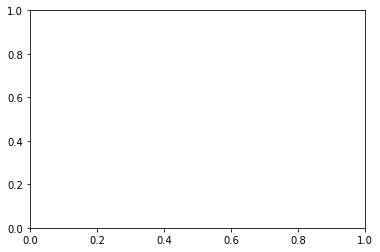

In [ ]:
def spectral_contrast(y, sr, title="", plot=plt.subplots()):
  S = np.abs(librosa.stft(y))
  contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
  fig, ax = plot
  img = librosa.display.specshow(contrast, x_axis='time', ax=ax)
  fig.colorbar(img, ax=ax)
  ax.set(ylabel='Frequency bands', title='Spectral contrast')

  return contrast, 'spectral_contrast'

# Random Notes - Sound Visualization


In [ ]:
%cd drive/MyDrive/ISPR MIDTERMS/1-A3/DIFFERENT_NOTES

/content/drive/MyDrive/ISPR MIDTERMS/1-A3/DIFFERENT_NOTES


In [ ]:
notes = [
    ("Cello A3_1", "cello_A3_1_forte_arco-normal.mp3"),     
    ("Cello B4_025", "cello_B4_025_forte_arco-normal.mp3"),
    ("Cello G5_15", "cello_G5_15_forte_arco-normal.mp3"),  
    ("Violin A3_1", "violin_A3_1_forte_arco-normal.mp3"),  
    ("Violin B4_025", "violin_B4_025_forte_arco-normal.mp3"),  
    ("Violin G5_15", "violin_G5_15_forte_arco-normal.mp3"), 
    ("Trombone A3_1", "trombone_A3_1_forte_normal.mp3"),    
    ("Trombone B4_025", "trombone_B4_025_forte_normal.mp3"),    
    ("Trombone G5_15", "trombone_G5_15_forte_normal.mp3"),  
    ("Trumpet A3_1", "trumpet_A3_1_forte_normal.mp3"),     
    ("Trumpet B4_025", "trumpet_B4_025_forte_normal.mp3"),      
    ("Trumpet G5_15", "trumpet_G5_15_forte_normal.mp3")     
];

In [ ]:
notes = preprocess_notes(notes)

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/cor

## Full Spectrograms

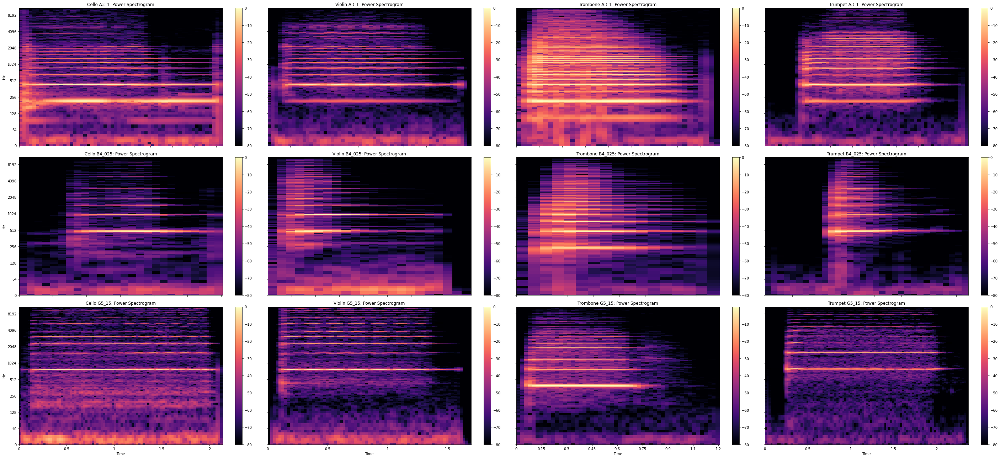

In [ ]:
grid_plot(full_spectrogram)

## Harmonics - Percussive Decomposition

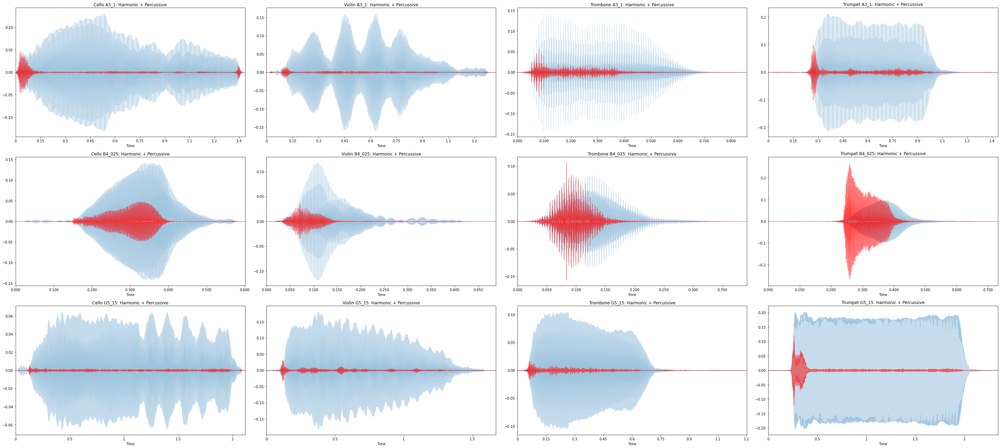

In [ ]:
grid_plot(plot_wave_hps, save_feature=False)

##Percussive Spectrograms

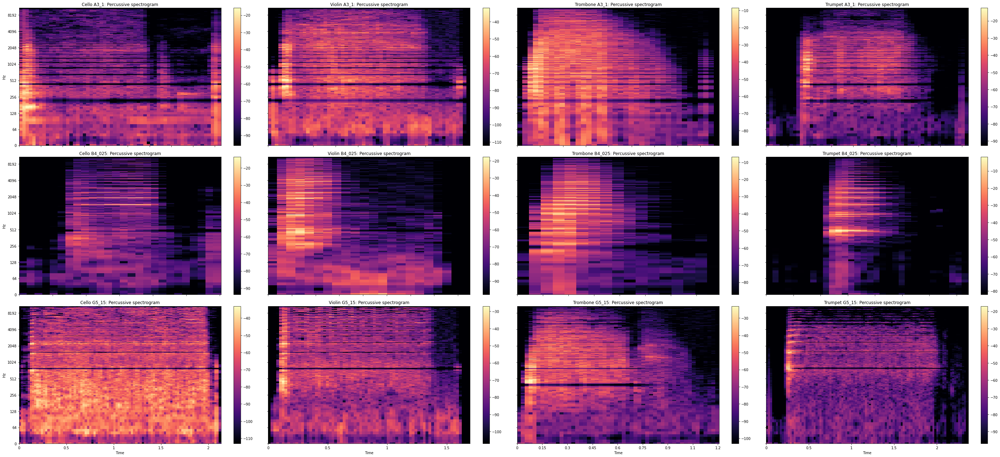

In [ ]:
grid_plot(percussive_spectrograms)

## Harmonics Spectrograms

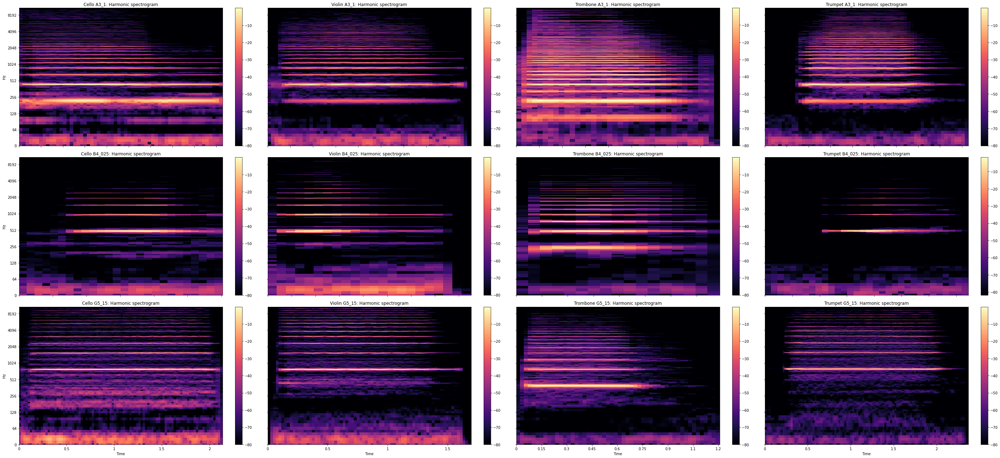

In [ ]:
grid_plot(harmonics_spectrograms)

## Spectral centroids (Full Spectrum)

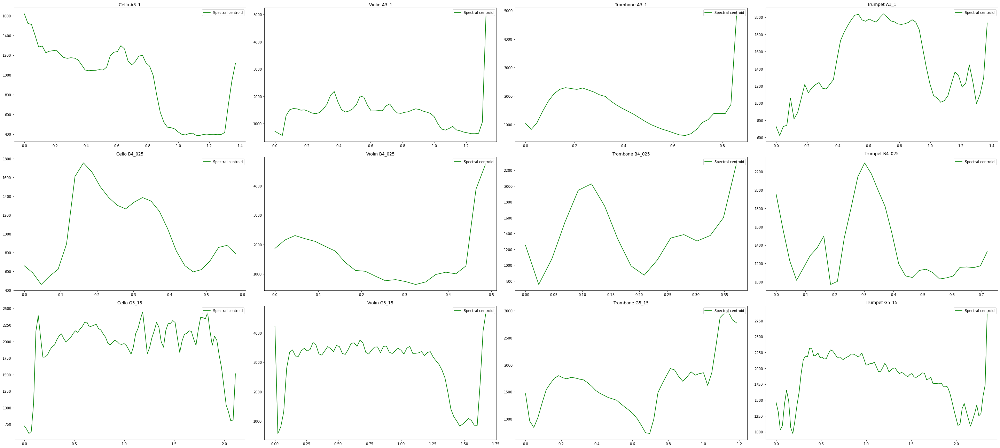

In [ ]:
grid_plot(spectral_centroids)

## Spectral centroids (Harmonics decomposition only)

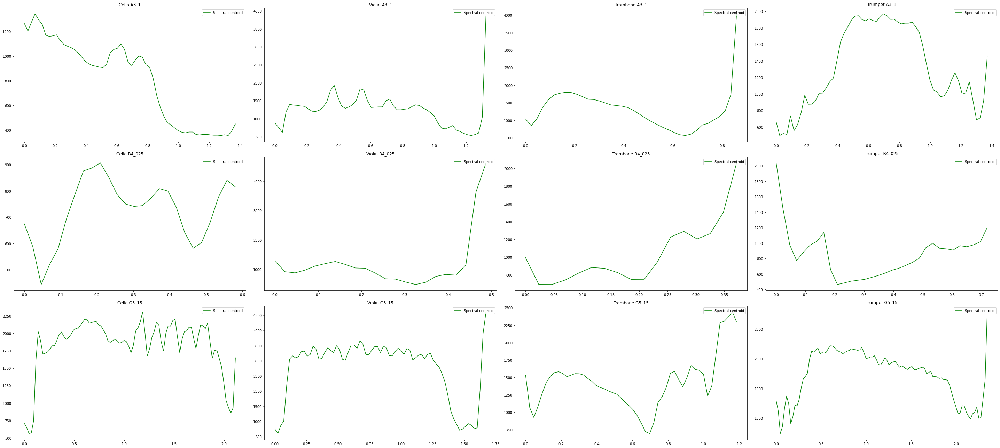

In [ ]:
grid_plot(spectral_centroids, h_only=True)

## Salience spectrogram

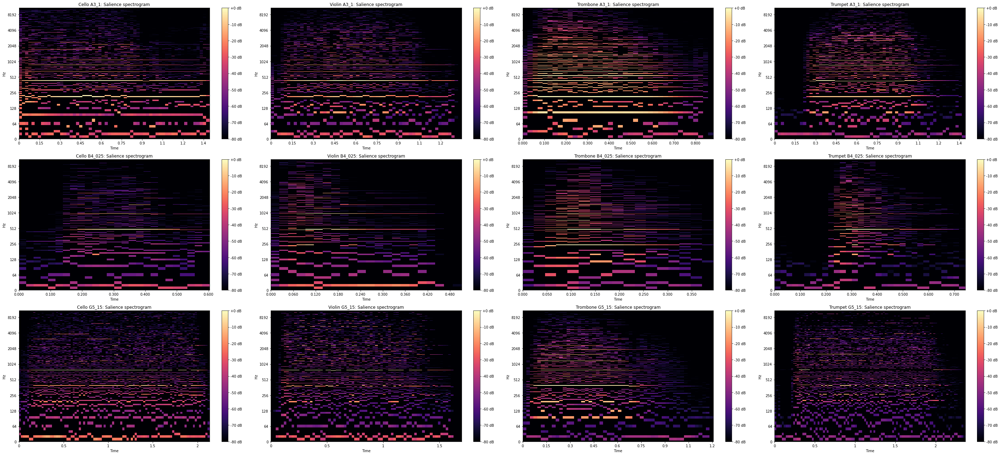

In [ ]:
grid_plot(salience_spectrogram)

## Spectral bandwidth 

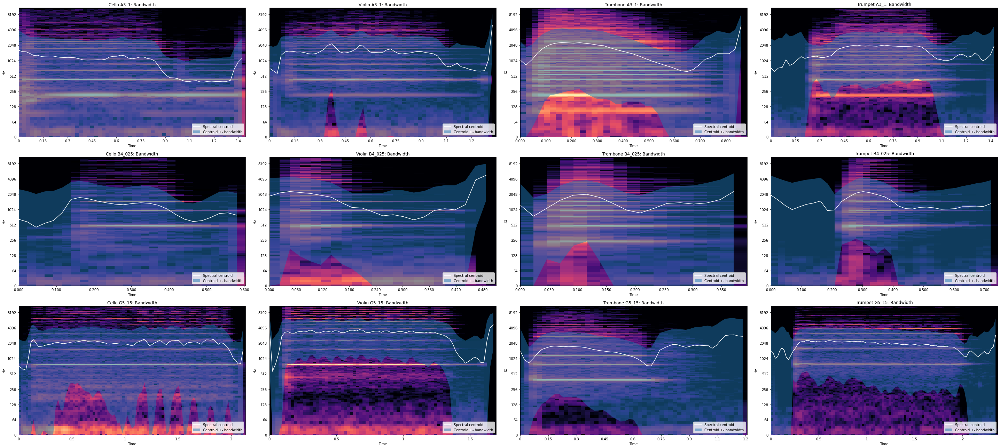

In [ ]:
grid_plot(spectral_bandwidth)

## Spectral Contrast

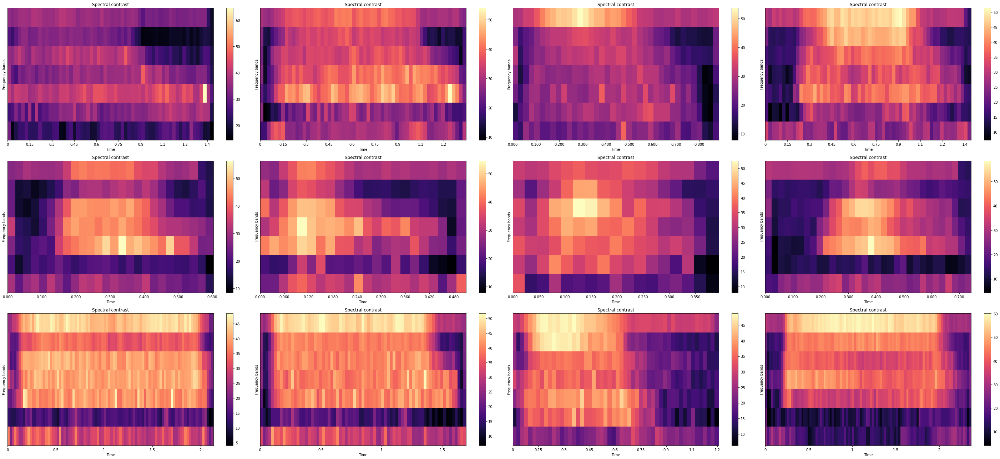

In [ ]:
grid_plot(spectral_contrast, h_only=True)

# Same note ad different octaves (fixed dynamic)

In [ ]:
%cd ../SAME_NOTES

/content/drive/MyDrive/ISPR MIDTERMS/1-A3/SAME_NOTES


In [ ]:
%ls

cello_C4_1_forte_arco-normal.mp3  trumpet_C5_1_forte_normal.mp3
cello_C5_1_forte_arco-normal.mp3  trumpet_C6_1_forte_normal.mp3
cello_C6_1_forte_arco-normal.mp3  violin_C4_1_forte_arco-normal.mp3
trombone_C4_1_forte_normal.mp3    violin_C5_1_forte_con-sord.mp3
trombone_C5_1_forte_normal.mp3    violin_C5_1_fortissimo_arco-normal.mp3
trombone_C6_1_forte_normal.mp3    violin_C6_1_forte_arco-normal.mp3
trumpet_C4_1_forte_normal.mp3


In [ ]:
same_notes = [
    ("Cello C4_1", "cello_C4_1_forte_arco-normal.mp3"),     
    ("Cello C5_1", "cello_C5_1_forte_arco-normal.mp3"),
    ("Cello C6_1", "cello_C6_1_forte_arco-normal.mp3"),  
    ("Violin C4_1", "violin_C4_1_forte_arco-normal.mp3"),  
    ("Violin C5_1", "violin_C5_1_fortissimo_arco-normal.mp3"), #Only the "Forte con sordina" version was present in the dataset for this note, so fortissimo has been picked, assuming it not to be so different. 
    ("Violin C6_1", "violin_C6_1_forte_arco-normal.mp3"), 
    ("Trombone C4_1", "trombone_C4_1_forte_normal.mp3"),    
    ("Trombone C5_1", "trombone_C5_1_forte_normal.mp3"),    
    ("Trombone C6_1", "trombone_C6_1_forte_normal.mp3"),  
    ("Trumpet C4_1", "trumpet_C4_1_forte_normal.mp3"),     
    ("Trumpet C5_1", "trumpet_C5_1_forte_normal.mp3"),      
    ("Trumpet C6_1", "trumpet_C6_1_forte_normal.mp3")     
];

In [ ]:
notes=preprocess_notes(same_notes)

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/cor

## Full Spectrograms

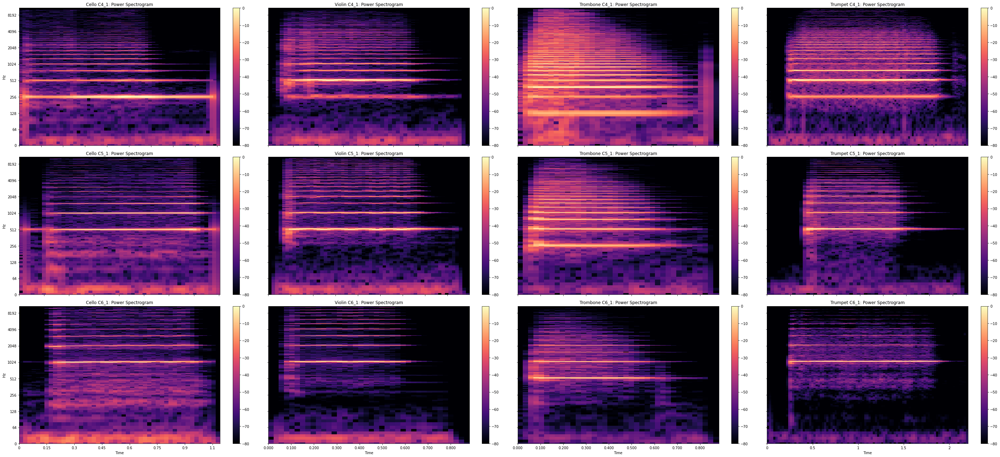

In [ ]:
grid_plot(full_spectrogram)

## Harmonics - Percussive Decomposition

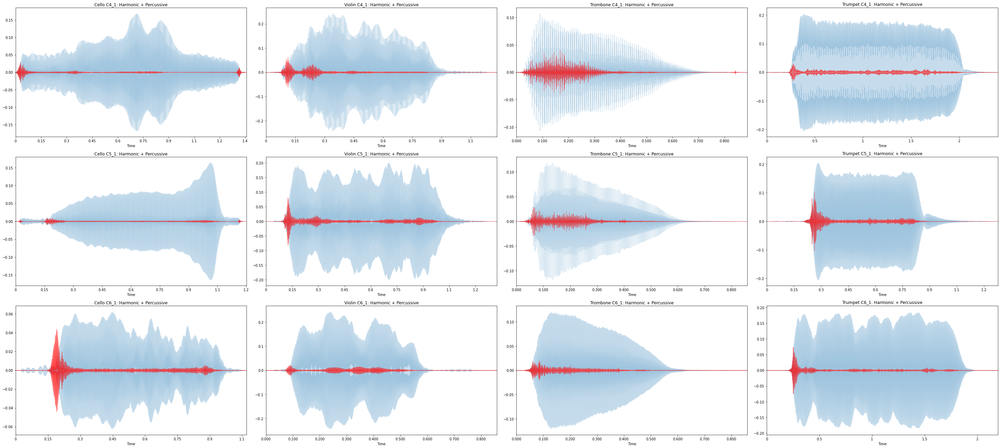

In [ ]:
grid_plot(plot_wave_hps, save_feature=False)

##Percussive Spectrograms

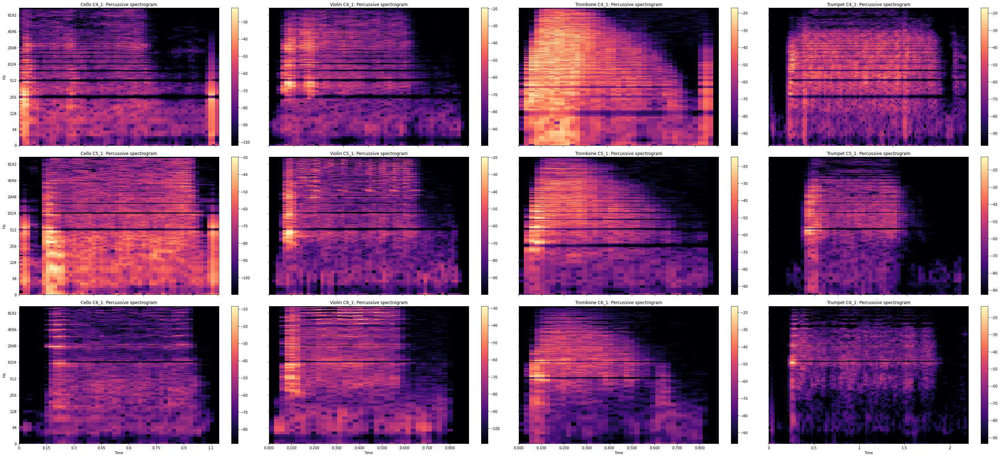

In [ ]:
grid_plot(percussive_spectrograms)

## Harmonics Spectrograms

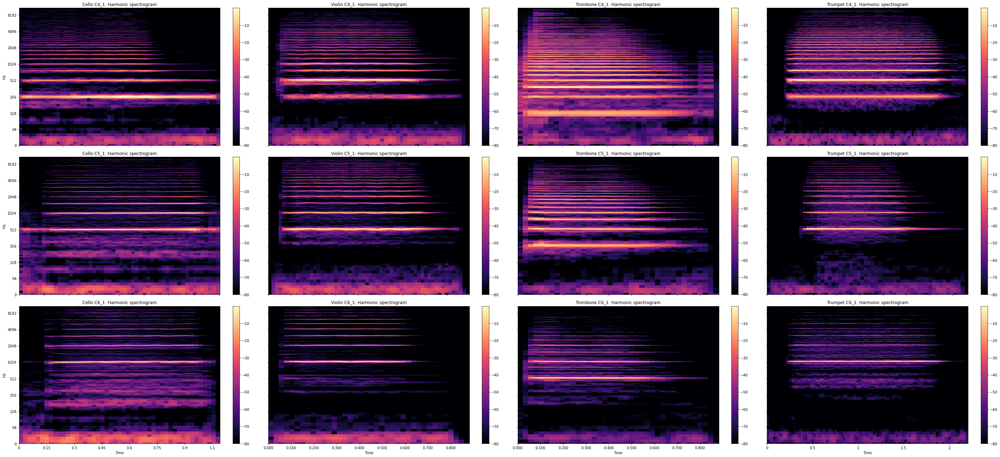

In [ ]:
grid_plot(harmonics_spectrograms)

## Spectral centroids  (Full Spectrum)






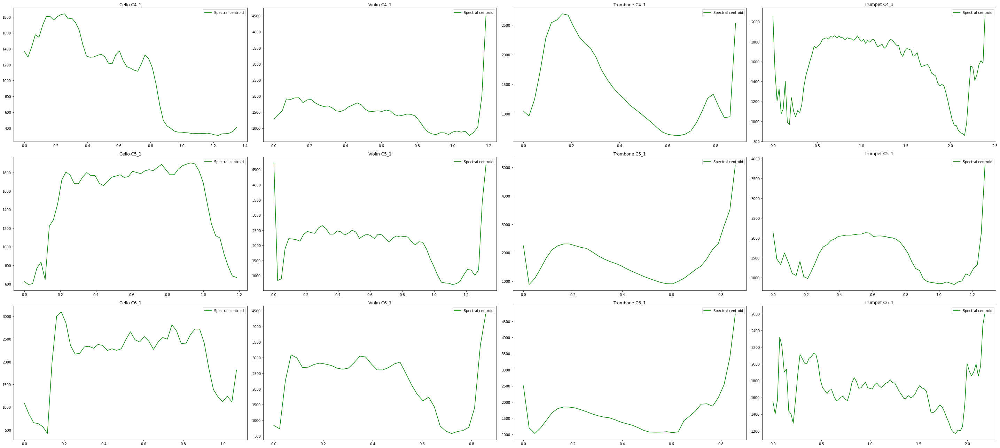

In [ ]:
grid_plot(spectral_centroids)

## Spectral centroids  (Harmonics decomposition only) 

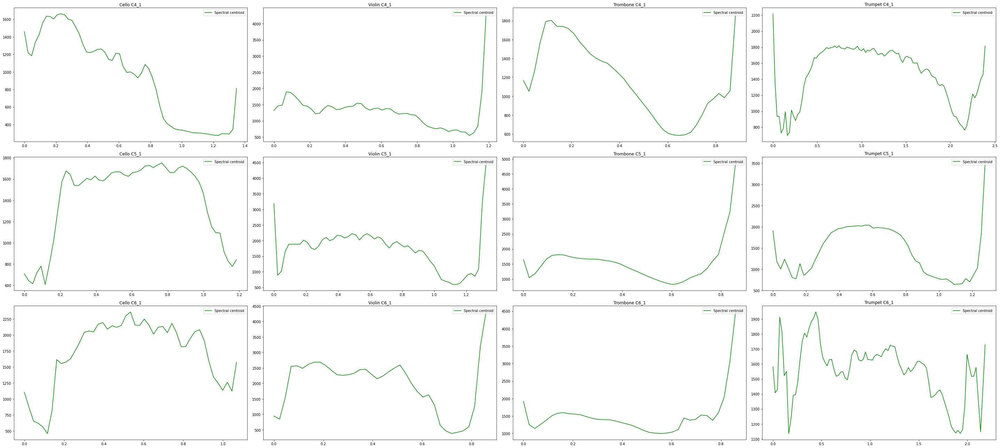

In [ ]:
grid_plot(spectral_centroids, h_only=True)

## Spectral bandwidth

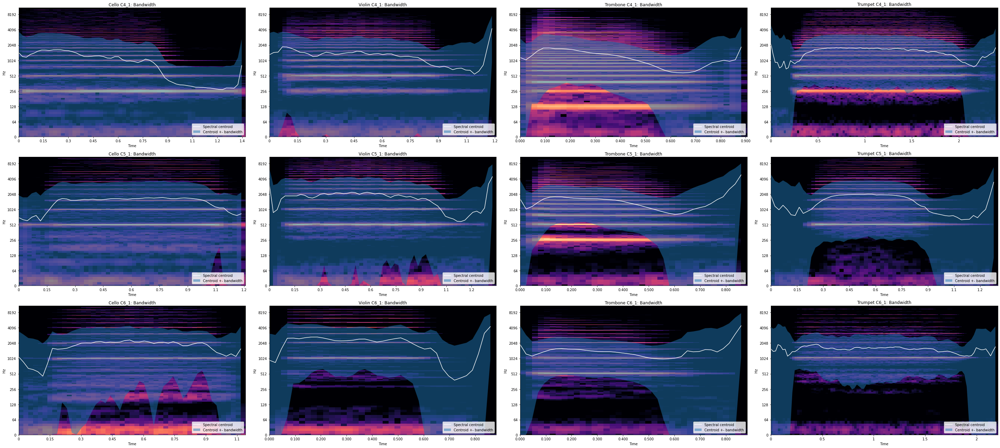

In [ ]:
grid_plot(spectral_bandwidth, h_only=True)

## Salience spectrogram

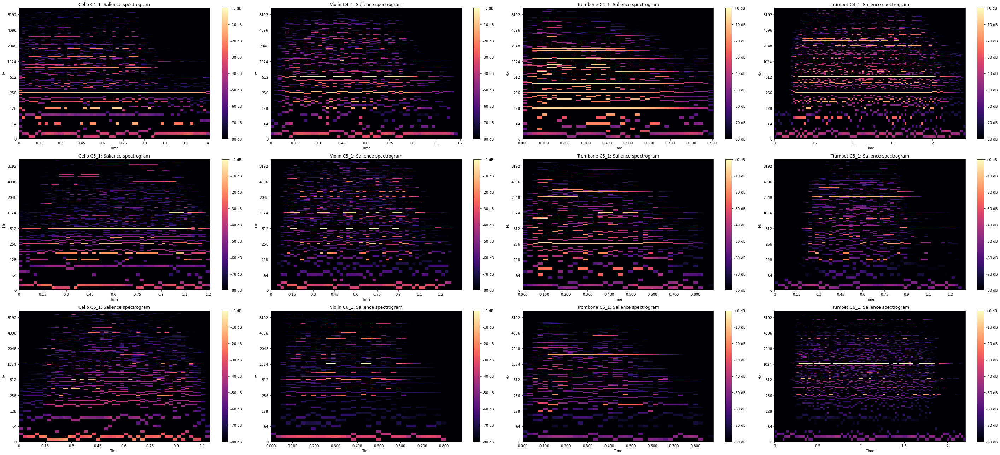

In [ ]:
grid_plot(salience_spectrogram, h_only=True)

## Spectral Contrast

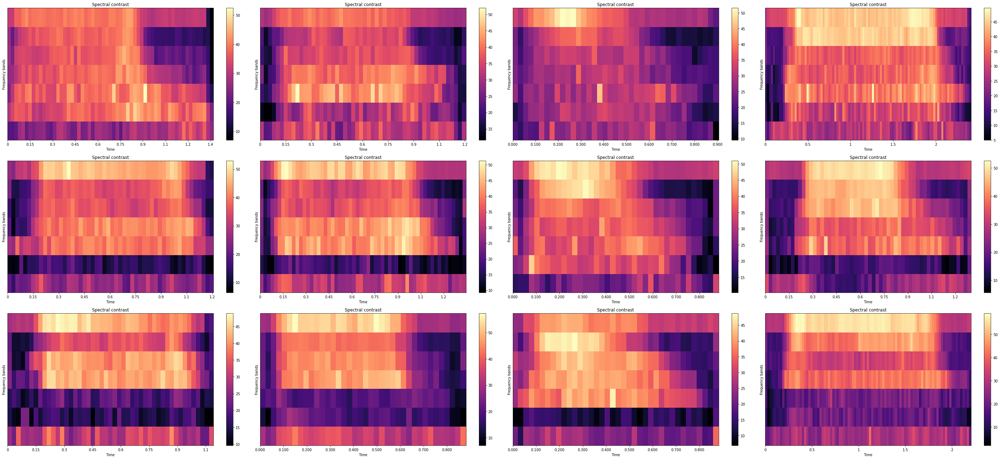

In [ ]:
grid_plot(spectral_contrast, h_only=True)

# Same note - different dynamic

In [ ]:
%cd ../DIFFERENT_DYNAMICS 

/content/drive/MyDrive/ISPR MIDTERMS/1-A3/DIFFERENT_DYNAMICS


In [ ]:
%ls 

cello_B4_05_forte_arco-normal.mp3       trumpet_B4_05_forte_normal.mp3
cello_B4_05_fortissimo_arco-normal.mp3  trumpet_B4_05_fortissimo_normal.mp3
cello_B4_05_pianissimo_arco-normal.mp3  trumpet_B4_05_pianissimo_normal.mp3
trombone_B4_05_forte_normal.mp3         violin_B4_05_forte_arco-normal.mp3
trombone_B4_05_fortissimo_normal.mp3    violin_B4_05_fortissimo_arco-normal.mp3
trombone_B4_05_pianissimo_normal.mp3    violin_B4_05_pianissimo_arco-normal.mp3


In [ ]:
differnet_dynamics = [
    ("Cello B4_05", "cello_B4_05_forte_arco-normal.mp3"),   
    ("Cello B4_05", "cello_B4_05_fortissimo_arco-normal.mp3"), 
    ("Cello B4_05", "cello_B4_05_pianissimo_arco-normal.mp3"),       
    ("Violin B4_05", "violin_B4_05_forte_arco-normal.mp3"),   
    ("Violin B4_05", "violin_B4_05_fortissimo_arco-normal.mp3"), 
    ("Violin B4_05", "violin_B4_05_pianissimo_arco-normal.mp3"),
    ("Trombone B4_05", "trombone_B4_05_forte_normal.mp3"),   
    ("Trombone B4_05", "trombone_B4_05_fortissimo_normal.mp3"), 
    ("Trombone B4_05", "trombone_B4_05_pianissimo_normal.mp3"),      
    ("Trumpet B4_05", "trumpet_B4_05_forte_normal.mp3"),   
    ("Trumpet B4_05", "trumpet_B4_05_fortissimo_normal.mp3"), 
    ("Trumpet B4_05", "trumpet_B4_05_pianissimo_normal.mp3")
];

In [ ]:
notes= preprocess_notes(differnet_dynamics) 

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/cor

## Full Spectrograms

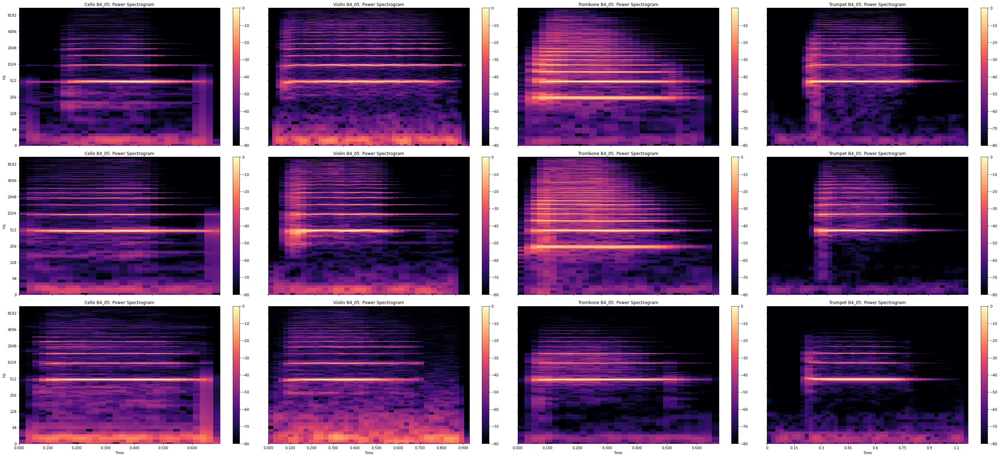

In [ ]:
grid_plot(full_spectrogram)

## Harmonics - Percussive Decomposition

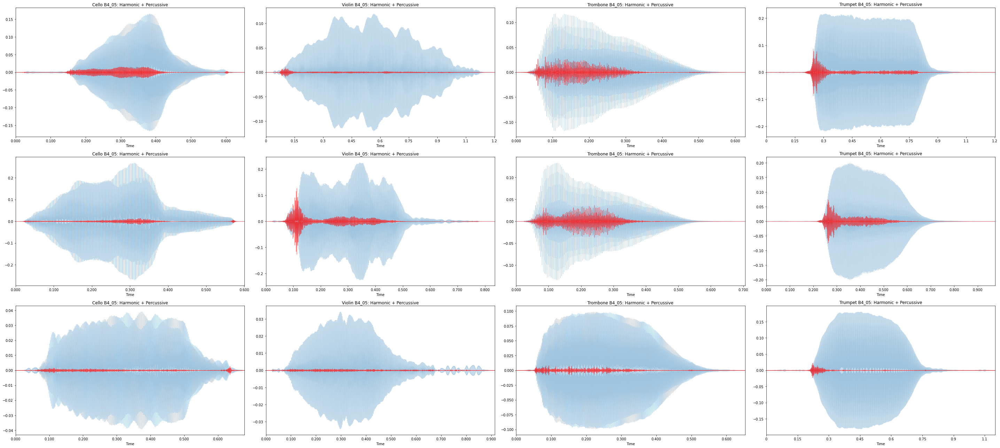

In [ ]:
grid_plot(plot_wave_hps, save_feature=False)

##Percussive Spectrograms

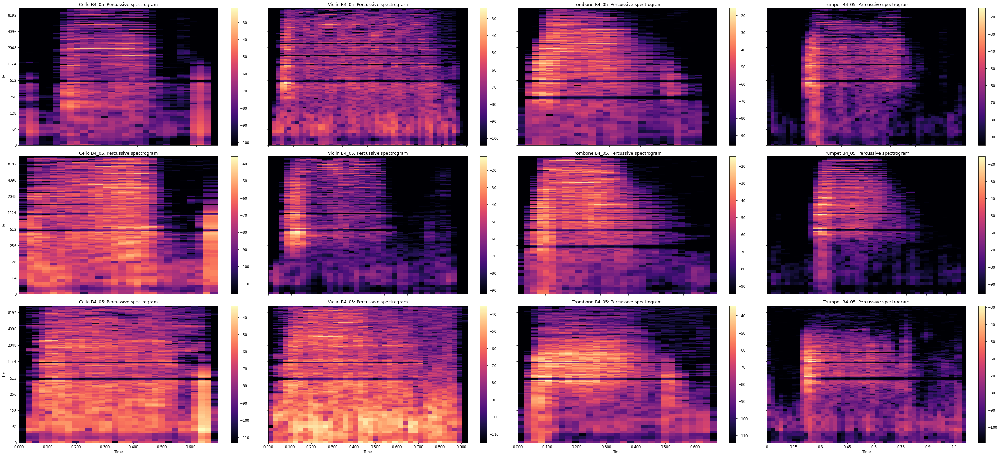

In [ ]:
grid_plot(percussive_spectrograms)

## Harmonics Spectrograms

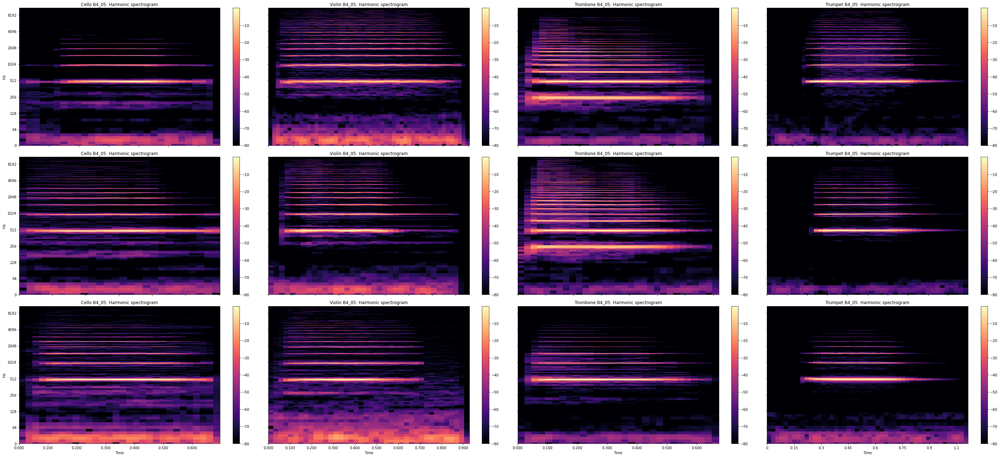

In [ ]:
grid_plot(harmonics_spectrograms)

## Spectral centroids  (Full Spectrum)






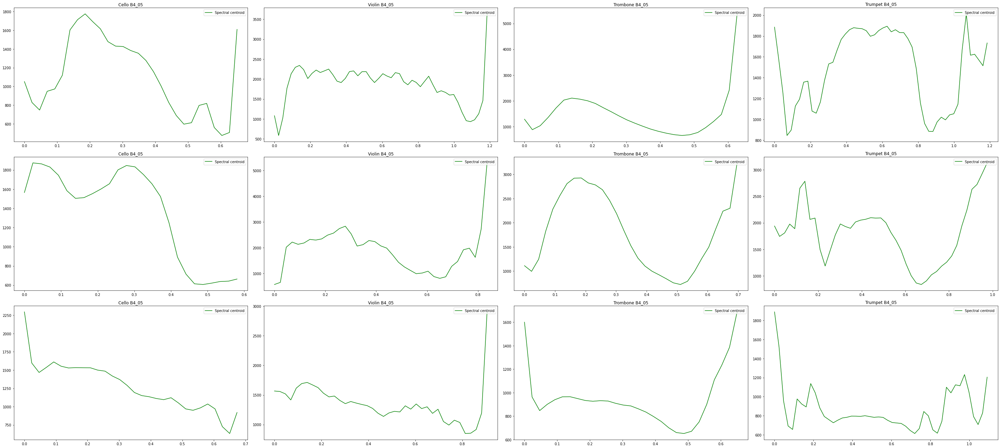

In [ ]:
grid_plot(spectral_centroids)

## Spectral centroids  (Harmonics decomposition only) 

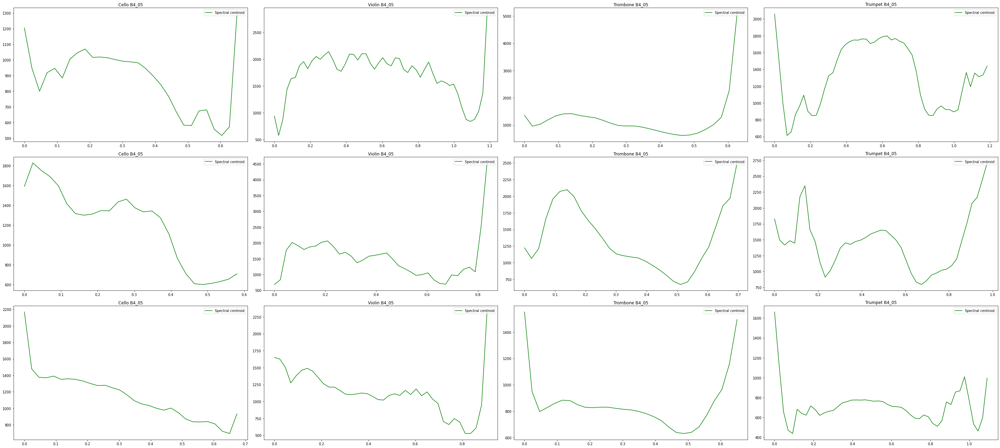

In [ ]:
grid_plot(spectral_centroids, h_only=True)

## Spectral bandwidth

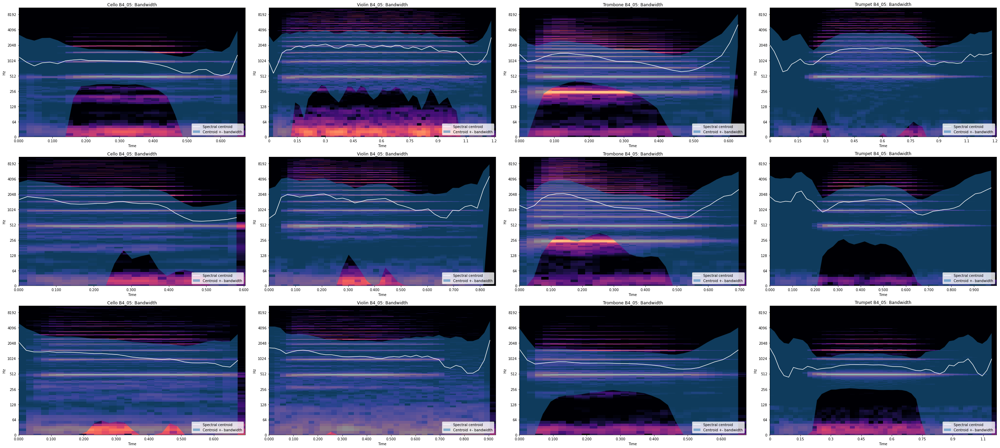

In [ ]:
grid_plot(spectral_bandwidth, h_only=True)

## Salience spectrogram

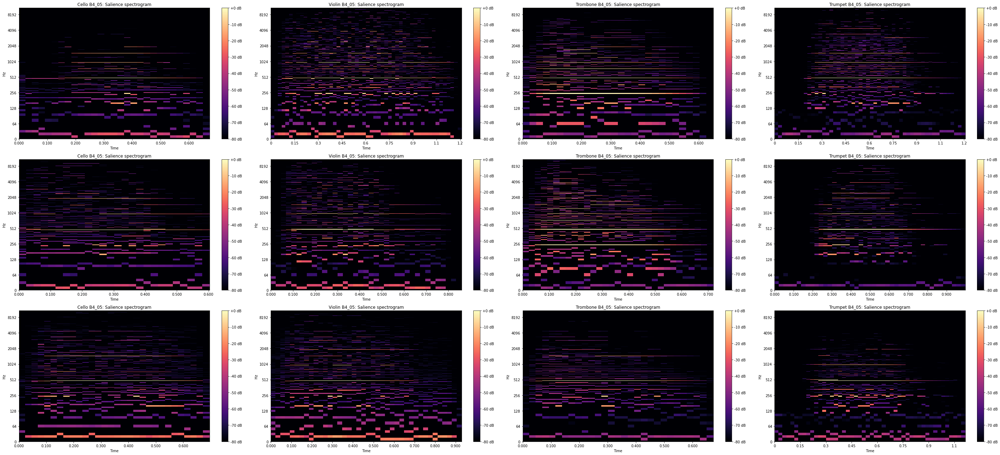

In [ ]:
grid_plot(salience_spectrogram, h_only=True)

## Spectral Contrast

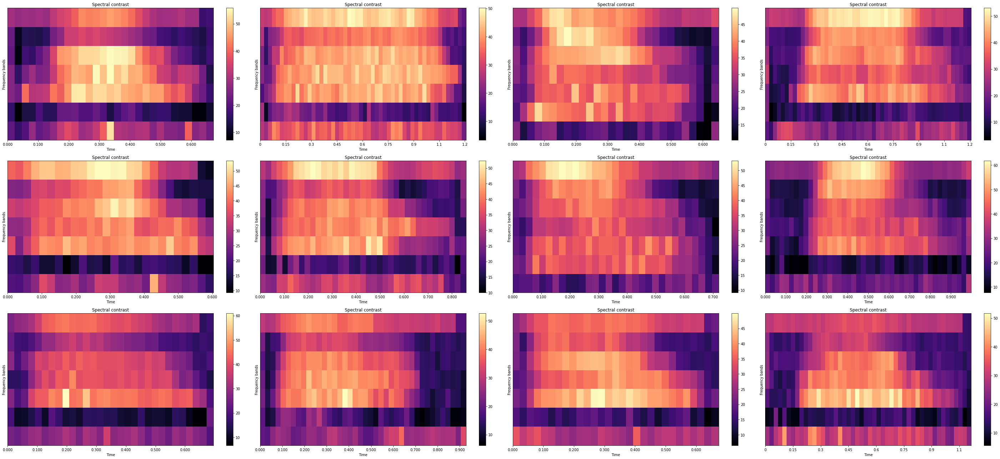

In [ ]:
grid_plot(spectral_contrast, h_only=True)